##### Importing libraries for web scrapping and data wrangling

In [68]:
from bs4 import BeautifulSoup
import requests
import csv

import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# import k-means from clustering stage
#!pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


#### Source to get neighborhoods of city(Ahmedabad)

In [2]:
source = requests.get("https://ahmedabadcity.gov.in/portal/jsp/Static_pages/amc_zone_list.jsp")

#### Using BeautifulSoup to scrap data

In [3]:
soup = BeautifulSoup(source.content, 'lxml')
print(soup.prettify())

<!DOCTYPE html>
<html xmlns="http://www.w3.org/1999/xhtml">
 <head>
  <meta content="text/html; charset=utf-8" http-equiv="Content-Type"/>
  <meta content="add description" name="description"/>
  <meta content="add content keywords" name="keywords"/>
  <meta content="width=device-width, initial-scale=1.0" name="viewport"/>
  <meta content="IE=Edge,chrome=1" http-equiv="X-UA-Compatible"/>
  <title>
   Zone &amp; Ward Details :: Ahmedabad Municipal Corporation
  </title>
  <!-- Body Style Sheet -->
  <script language="JavaScript" src="/portal/script/homePage/AMCNewScript/jquery-1.10.1.min.js" type="text/javascript">
  </script>
  <script language="JavaScript" src="/portal/script/homePage/AMCNewScript/loginscript.js" type="text/javascript">
  </script>
  <script language="JavaScript" src="/portal/script/homePage/AMCNewScript/fontresize.js" type="text/javascript">
  </script>
  <link href="/portal/style/homePage/AMCNewStyle/body.css" rel="stylesheet" type="text/css"/>
  <link href="/portal

In [4]:
output = []
for i in range(1,7):
    table =soup.select('table')[i]
    rows = table.find_all('tr')
    for row in rows:
        cols = row.find_all('td')
        cols = [item.text.strip() for item in cols]
        output.append([item for item in cols if item])

In [5]:
output

[['Sr.\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tNo.',
  'Zone\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tName',
  'Ward\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tNo.',
  'Ward\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tName',
  'Ward\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tOffice Address',
  'Contact\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tNo.',
  'Area\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t(in Sq. Kms)'],
 ['1',
  'North Zone',
  '12',
  'Sardarnagar',
  'Nr.Pollice Station,Opp juni sardarnagar\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tward Office,Sardarnagar',
  '-',
  '5.35'],
 ['2',
  'North Zone',
  '13',
  'Noblenagar',
  'Naroda Police Station same,Hanuman ji\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tmandir ni pachad, Noblenagar',
  '-',
  '16.33'],
 ['3',
  'North Zone',
  '14',
  'Narodamuthiya',
  'Naroad Juni Panchavat Office, Noblenagar\r\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\tpani ni taki same,Naroda road',
  '-',
  '3.57

Now lets convert the data obtained into a data frame using pandas library.

In [6]:
df = pd.DataFrame(output, columns = ['Sr_No','Zone_Name','Ward_No','Neighborhood','Ward_office','Contact','Area(inSq.Kms)'])
df = df.iloc[1:]

#droping indexes that are not required
df = df.drop([3,11,12,13,14,20,25,26,36,40,41,46,51,52,63,64,75])
#Reseting indices
df.reset_index(inplace = True)
# droping columns that are not required for analysis
df.drop(['index','Sr_No','Ward_No','Ward_office','Contact','Area(inSq.Kms)'], axis=1, inplace = True)
df

,Zone_Name,Neighborhood
0,North Zone,Sardarnagar
1,North Zone,Noblenagar
2,North Zone,Kubernagar
3,North Zone,Saijpur
4,North Zone,Meghaninagar
5,North Zone,Asarwa
6,North Zone,Naroda road
7,North Zone,India colony
8,North Zone,Krushnagar
9,South Zone,Maninagar


#### Changing spellings of neighborhood according to geopy library inorder to get latitude and longitude details of neighborhoods.

In [7]:
df.loc[1]['Neighborhood'] = 'Noble nagar'
df.loc[8]['Neighborhood'] = 'Krishnanagar'
df.loc[11]['Neighborhood'] = 'Behrampura'
df.loc[20]['Neighborhood'] = 'Gomtipur'
df.loc[43]['Neighborhood'] = 'Naranpura'
df.loc[45]['Neighborhood'] = 'Juna Vadaj'
df.loc[53]['Neighborhood'] = 'Ghatlodiya'
df.loc[54]['Neighborhood'] =  'Chandlodiya'
df

,Zone_Name,Neighborhood
0,North Zone,Sardarnagar
1,North Zone,Noble nagar
2,North Zone,Kubernagar
3,North Zone,Saijpur
4,North Zone,Meghaninagar
5,North Zone,Asarwa
6,North Zone,Naroda road
7,North Zone,India colony
8,North Zone,Krishnanagar
9,South Zone,Maninagar


Fetching latitude and longitude of each neighborhood using Geopy library.

In [8]:
Latitude = []
Longitude = []

for i in df['Neighborhood']:
    #address = i
    #print(i)
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(i)
    Latitude.append(location.latitude)
    #print(Latitude)
    Longitude.append(location.longitude)
    #print(Longitude)
print(Latitude, Longitude)

[17.0934624, 12.9927532, 23.0804086, 22.3643755, 23.0556421, 27.1437843, 23.0514425, 29.46945, 23.4058481, 22.9977135, 23.0017632, 23.0035894, 22.9966938, 22.99124285, 25.9533595, 22.9589978, 22.9811295, 29.7123238, 25.7717823, 23.2541891, 23.0136957, 21.2379469, 23.0057574, 22.9991923, 23.5970883, 27.4344941, 23.2308253, 22.9948656, 46.397211, 49.05850705, 23.02139, 23.0263312, 25.82731105, 25.66420085, 25.3297912, 23.0559546, 23.0433545, 23.0502144, 23.0145531, 23.2770506, 19.4220373, 23.0359998, 1.3028989, 23.6741581, 13.4613569, 23.0670122, 23.0839931, 23.0797224, 22.983483, 23.0069372, 26.2967719, 23.0442268, 23.0485393, 23.075569, 23.0751633, 23.0766234, 50.9494849, 50.9488] [78.1658874, 80.1875904, 72.6340502, 72.8138491, 72.6156446, 74.5955586, 72.6264359, 79.62891, 88.4958935, 72.6067174, 72.5940885, 72.58384, 72.5833917, 72.61642315668566, 73.7532883, 72.6297981, 72.6012948, 75.6610666, 70.3106287, 72.8994569, 72.620581, 81.6336833, 72.6269822, 72.6207549, 72.9693061, 76.1823

In [9]:
df['Latitude'] = Latitude
df['Longitude'] = Longitude
df.head()

,Zone_Name,Neighborhood,Latitude,Longitude
0,North Zone,Sardarnagar,17.093462,78.165887
1,North Zone,Noble nagar,12.992753,80.187590
2,North Zone,Kubernagar,23.080409,72.634050
3,North Zone,Saijpur,22.364376,72.813849
4,North Zone,Meghaninagar,23.055642,72.615645


##### Exporting the clean data to a csv

In [ ]:
#df.to_csv('adi_neigh.csv')

#### Use geopy library to get the latitude and longitude values of Ahmedabad City.

In [10]:
address = 'ahmedabad'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Ahmedabad City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Ahmedabad City are 23.0216238, 72.5797068.


In [11]:
adi_data = pd.read_csv('adi_neigh.csv')
adi_data.drop('Unnamed: 0', axis = 1, inplace= True )
adi_data.head()

,Zone_Name,Neighborhood,Latitude,Longitude
0,North Zone,Sardarnagar,23.083000,72.620400
1,North Zone,Noble nagar,23.088700,72.656800
2,North Zone,Kubernagar,23.080409,72.634050
3,North Zone,Saijpur,23.057500,72.637500
4,North Zone,Meghaninagar,23.055642,72.615645


Using folium library to plot geographical data of ahmedabad with neighborhoods superimposed on map.

In [13]:
map_adi = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(adi_data['Latitude'], adi_data['Longitude'], adi_data['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
    ).add_to(map_adi)  
    
map_adi

#### Define Foursquare Credentials and Version

In [15]:
CLIENT_ID = 'P0RKHA0JEFAETXNSETJOT5NU0YC11G3UM2RNJTTYBZFVTZW4' # your Foursquare ID
CLIENT_SECRET = 'EVAMEQBQMFFQ0ALLAMRFP21SG0ZFMEJTIQDOWWCH4XVU4IFU' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: P0RKHA0JEFAETXNSETJOT5NU0YC11G3UM2RNJTTYBZFVTZW4
CLIENT_SECRET:EVAMEQBQMFFQ0ALLAMRFP21SG0ZFMEJTIQDOWWCH4XVU4IFU


In [16]:
# type your answer here
LIMIT = 100
radius = 500

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)

url

'https://api.foursquare.com/v2/venues/explore?&client_id=P0RKHA0JEFAETXNSETJOT5NU0YC11G3UM2RNJTTYBZFVTZW4&client_secret=EVAMEQBQMFFQ0ALLAMRFP21SG0ZFMEJTIQDOWWCH4XVU4IFU&v=20180605&ll=23.035999800000003,72.5643429&radius=500&limit=100'

##  Exploring Neighborhoods in Ahmedabad

In [18]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood',
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Using Foursqaure API to fetch venues for each neighborhood.

In [19]:
adi_venues = getNearbyVenues(names=adi_data['Neighborhood'],
                                   latitudes=adi_data['Latitude'],
                                   longitudes=adi_data['Longitude']
                                  )

Sardarnagar
Noble nagar
Kubernagar
Saijpur
Meghaninagar
Asarwa
Naroda road
India colony
Krishnanagar
Maninagar
Kankaria
Behrampura
Danilimda
Ghodasar
Khokhara
Vatva
Isanpur
Lambha
Bapunagar
Rakhiyal
Gomtipur
Rajpur
Amraiwadi
Bhaipura
Mahavirnagar
Viratnagar
odhav
Vastral
Ramol
Nikol
Khadia
Kalupur
Dariapur
Shahpur
Jamalpur
Dudheshwar
Madhupura
Girdharnagar
Paldi
Vasna
Ambawadi
Navrangpura
Stadium
Naranpura
New Wadaj
Juna Vadaj
Sabarmati
Chandkheda-Motera
Sarkhej
Vejalpur
Jodhpur
Bodakdev
Thaltej
Ghatlodiya
Chandlodiya
Ranip
Gota
Kali


Now lets create a data frame for the fetched venues.

In [20]:
print(adi_venues.shape)
adi_venues

(196, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Sardarnagar,23.083000,72.620400,Shambhu's,23.083308,72.620098,Coffee Shop
1,Sardarnagar,23.083000,72.620400,The Gateway Hotel Ummed Ahmedabad,23.082470,72.616503,Speakeasy
2,Sardarnagar,23.083000,72.620400,Narmada,23.082377,72.616582,Indian Restaurant
3,Sardarnagar,23.083000,72.620400,GAD - Gateway All Day,23.082461,72.616506,Coffee Shop
4,Sardarnagar,23.083000,72.620400,Taj Residency Ummed,23.081322,72.616794,Hotel
5,Sardarnagar,23.083000,72.620400,Comfort Inn,23.080931,72.616650,Hotel
6,Noble nagar,23.088700,72.656800,tt table,23.092510,72.659277,Tennis Stadium
7,Kubernagar,23.080409,72.634050,Monginis Cake Shop,23.077240,72.634650,Bakery
8,Saijpur,23.057500,72.637500,Axis Bank ATM,23.057390,72.637772,ATM
9,Saijpur,23.057500,72.637500,Axis Bank ATM,23.055650,72.637200,ATM


In [21]:
adi_venues.drop(['Neighborhood Latitude', 'Neighborhood Longitude'], axis = 1, inplace = True)
adi_venues.head()

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Sardarnagar,Shambhu's,23.083308,72.620098,Coffee Shop
1,Sardarnagar,The Gateway Hotel Ummed Ahmedabad,23.082470,72.616503,Speakeasy
2,Sardarnagar,Narmada,23.082377,72.616582,Indian Restaurant
3,Sardarnagar,GAD - Gateway All Day,23.082461,72.616506,Coffee Shop
4,Sardarnagar,Taj Residency Ummed,23.081322,72.616794,Hotel


In [ ]:
#adi_venues.to_csv('adi_venues.csv')

#### Zomato Restaurants data a CSV file 
Source of csv file is kaggle website.

In [31]:
Zoma_Res = pd.read_csv('zomato_restaurants_in_India.csv', low_memory=False)
Zoma_Res.head(20)

,res_id,name,establishment,url,address,city,city_id,locality,latitude,longitude,zipcode,country_id,locality_verbose,cuisines,timings,average_cost_for_two,price_range,currency,highlights,aggregate_rating,rating_text,votes,photo_count,opentable_support,delivery,takeaway
0,18757684,Ph Se Food,['Casual Dining'],https://www.zomato.com/ahmedabad/ph-se-food-bo...,"205-206, Silve Radiance, Sindhu Bhawan Road, P...",Ahmedabad,11,Bodakdev,23.038755,72.510887,380054,1,"Bodakdev, Ahmedabad","North Indian, Chinese, Fast Food",12noon – 11pm (Mon-Sun),900,3,Rs.,"['Dinner', 'Cash', 'Takeaway Available', 'Cred...",4.5,Excellent,1434,773,0.0,-1,-1
1,18658177,Millhouse,['Casual Dining'],https://www.zomato.com/ahmedabad/millhouse-1-v...,"3rd Floor, Alpha One Mall, Vastrapur, Ahmedabad",Ahmedabad,11,"Ahmedabad One Mall, Vastrapur",23.039770,72.531508,NaN,1,"Ahmedabad One Mall, Vastrapur, Ahmedabad","Continental, Italian",11 AM to 11 PM,1200,3,Rs.,"['No Alcohol Available', 'Debit Card', 'Credit...",4.5,Excellent,1530,768,0.0,-1,-1
2,18663856,The Red Bistro,['Casual Dining'],https://www.zomato.com/ahmedabad/the-red-bistr...,"Armeida, Sindhu Bhavan Road, Off SG Road, Boda...",Ahmedabad,11,Bodakdev,23.039852,72.509181,NaN,1,"Bodakdev, Ahmedabad","Mexican, Italian, North Indian","6:30 PM to 10:45 PM (Mon), 12 Noon to 10:45 PM...",1400,3,Rs.,"['Lunch', 'Delivery', 'Debit Card', 'Dinner', ...",4.6,Excellent,695,631,0.0,-1,-1
3,18819827,Kadak Bhagat,['Casual Dining'],https://www.zomato.com/ahmedabad/kadak-bhagat-...,"1, First Floor, Dev Aurum Complex, Deer Cirle,...",Ahmedabad,11,Prahlad Nagar,23.012411,72.514392,NaN,1,"Prahlad Nagar, Ahmedabad","North Indian, Chinese, Fast Food","11:30 AM to 3:30 PM, 7 PM to 11 PM",1000,3,Rs.,"['Credit Card', 'Dinner', 'Cash', 'Debit Card'...",4.4,Very Good,977,188,0.0,1,-1
4,18718880,Urban Khichdi,['Casual Dining'],https://www.zomato.com/ahmedabad/urban-khichdi...,"A -103, Shivalik Plaza, Opposite AMA, IIM Road...",Ahmedabad,11,Vastrapur,23.028315,72.542458,380015,1,"Vastrapur, Ahmedabad","North Indian, Continental","Mon-Sun (12 Noon to 4 PM, 7 PM to 11 PM)",600,2,Rs.,"['Dinner', 'Delivery', 'Debit Card', 'Lunch', ...",4.7,Excellent,619,305,0.0,1,-1
5,18707059,Soulmate - Make Moments Memorable,['Casual Dining'],https://www.zomato.com/ahmedabad/soulmate-make...,"Shop 102, Addor Aspire, University Road, Navra...",Ahmedabad,11,Navrangpura,23.030857,72.548006,380015,1,"Navrangpura, Ahmedabad","Italian, Continental","11 AM to 3 PM, 7 PM to 12 Midnight",1500,4,Rs.,"['Lunch', 'Cash', 'Debit Card', 'Dinner', 'Del...",4.7,Excellent,477,480,0.0,-1,-1
6,18396250,Huber & Holly,['Dessert Parlour'],https://www.zomato.com/ahmedabad/huber-holly-1...,"7 B, Pakwan Cross Road, Boadakdev, Ahmedabad",Ahmedabad,11,Bodakdev,23.038169,72.512435,NaN,1,"Bodakdev, Ahmedabad","Desserts, Italian",10am – 3am (Mon-Sun),500,2,Rs.,"['Cash', 'Takeaway Available', 'Credit Card', ...",4.8,Excellent,1545,2045,0.0,1,-1
7,18672107,Eleven 11 Restro Cafe,['Café'],https://www.zomato.com/ahmedabad/eleven-11-res...,"106/107, Silver Radiance, Sindhu Bhavan Road, ...",Ahmedabad,11,Bodakdev,23.038747,72.510827,NaN,1,"Bodakdev, Ahmedabad","Cafe, Italian, North Indian",11 AM to 11 PM,1000,3,Rs.,"['No Alcohol Available', 'Dinner', 'Cash', 'Ta...",4.3,Very Good,1273,1091,0.0,-1,-1
8,113895,Anjoy Latenight Meals,[],https://www.zomato.com/ahmedabad/anjoy-latenig...,"B -3, Himalaya Complex, Nehru Park Fountain, N...",Ahmedabad,11,Vastrapur,23.036743,72.527817,NaN,1,"Vastrapur, Ahmedabad","North Indian, Fast Food","12 Noon to 4 PM, 7:30 PM to 4:30 AM",500,2,Rs.,"['No Alcohol Available', 'Delivery', 'No Seati...",4.3,Very Good,1284,49,0.0,1,-1
9,18766005,The Esplendido Cafe,['Café'],https://www.zomato.com/ahmedabad/the-esplendid...,"Ground Floor, Law Garden Cross Road, Opposite ...",Ahmedabad,11,Navrangpura,23.028663,72.560280,NaN,1,"Navrangpura, Ahmedabad","Cafe, American, Italian, Chinese",11:30am – 11:30pm (Mon-Sun),800,3,Rs.,"['Cash', 'Delivery', 'Credit Card', 'Lunch', 

In [32]:
Zoma_Res.drop(['url', 'address', 'city', 'city_id', 'zipcode','country_id', 'locality_verbose', \
               'timings', 'price_range', 'currency', 'highlights', 'votes', 'photo_count', 'opentable_support', \
               'delivery', 'takeaway'], axis = 1, inplace = True)
Zoma_Res.rename(columns={"name": 'Venue', "establishment": 'Venue Category', "locality":"Neighborhood" \
                        , 'latitude': 'Venue Latitude', 'longitude': 'Venue Longitude'}, inplace = True)
Zoma_Res.head(20)

,res_id,Venue,Venue Category,Neighborhood,Venue Latitude,Venue Longitude,cuisines,average_cost_for_two,aggregate_rating,rating_text
0,18757684,Ph Se Food,['Casual Dining'],Bodakdev,23.038755,72.510887,"North Indian, Chinese, Fast Food",900,4.5,Excellent
1,18658177,Millhouse,['Casual Dining'],"Ahmedabad One Mall, Vastrapur",23.039770,72.531508,"Continental, Italian",1200,4.5,Excellent
2,18663856,The Red Bistro,['Casual Dining'],Bodakdev,23.039852,72.509181,"Mexican, Italian, North Indian",1400,4.6,Excellent
3,18819827,Kadak Bhagat,['Casual Dining'],Prahlad Nagar,23.012411,72.514392,"North Indian, Chinese, Fast Food",1000,4.4,Very Good
4,18718880,Urban Khichdi,['Casual Dining'],Vastrapur,23.028315,72.542458,"North Indian, Continental",600,4.7,Excellent
5,18707059,Soulmate - Make Moments Memorable,['Casual Dining'],Navrangpura,23.030857,72.548006,"Italian, Continental",1500,4.7,Excellent
6,18396250,Huber & Holly,['Dessert Parlour'],Bodakdev,23.038169,72.512435,"Desserts, Italian",500,4.8,Excellent
7,18672107,Eleven 11 Restro Cafe,['Café'],Bodakdev,23.038747,72.510827,"Cafe, Italian, North Indian",1000,4.3,Very Good
8,113895,Anjoy Latenight Meals,[],Vastrapur,23.036743,72.527817,"North Indian, Fast Food",500,4.3,Very Good
9,18766005,The Esplendido Cafe,['Café'],Navrangpura,23.028663,72.560280,"Cafe, American, Italian, Chinese",800,4.5,Excellent


Replacing empty values with np.nan so that NAN values can be removed easily.

In [33]:
Zoma_Res['Venue Category'].replace(to_replace = '[]', value = np.nan, inplace = True)
Zoma_Res.head(20)

,res_id,Venue,Venue Category,Neighborhood,Venue Latitude,Venue Longitude,cuisines,average_cost_for_two,aggregate_rating,rating_text
0,18757684,Ph Se Food,['Casual Dining'],Bodakdev,23.038755,72.510887,"North Indian, Chinese, Fast Food",900,4.5,Excellent
1,18658177,Millhouse,['Casual Dining'],"Ahmedabad One Mall, Vastrapur",23.039770,72.531508,"Continental, Italian",1200,4.5,Excellent
2,18663856,The Red Bistro,['Casual Dining'],Bodakdev,23.039852,72.509181,"Mexican, Italian, North Indian",1400,4.6,Excellent
3,18819827,Kadak Bhagat,['Casual Dining'],Prahlad Nagar,23.012411,72.514392,"North Indian, Chinese, Fast Food",1000,4.4,Very Good
4,18718880,Urban Khichdi,['Casual Dining'],Vastrapur,23.028315,72.542458,"North Indian, Continental",600,4.7,Excellent
5,18707059,Soulmate - Make Moments Memorable,['Casual Dining'],Navrangpura,23.030857,72.548006,"Italian, Continental",1500,4.7,Excellent
6,18396250,Huber & Holly,['Dessert Parlour'],Bodakdev,23.038169,72.512435,"Desserts, Italian",500,4.8,Excellent
7,18672107,Eleven 11 Restro Cafe,['Café'],Bodakdev,23.038747,72.510827,"Cafe, Italian, North Indian",1000,4.3,Very Good
8,113895,Anjoy Latenight Meals,NaN,Vastrapur,23.036743,72.527817,"North Indian, Fast Food",500,4.3,Very Good
9,18766005,The Esplendido Cafe,['Café'],Navrangpura,23.028663,72.560280,"Cafe, American, Italian, Chinese",800,4.5,Excellent


In [34]:
Zoma_Res.isnull().values.any()

True

In [35]:
Zoma_Res.dropna(inplace=True)
Zoma_Res.reset_index()

,index,res_id,Venue,Venue Category,Neighborhood,Venue Latitude,Venue Longitude,cuisines,average_cost_for_two,aggregate_rating,rating_text
0,0,18757684,Ph Se Food,['Casual Dining'],Bodakdev,23.038755,72.510887,"North Indian, Chinese, Fast Food",900,4.5,Excellent
1,1,18658177,Millhouse,['Casual Dining'],"Ahmedabad One Mall, Vastrapur",23.039770,72.531508,"Continental, Italian",1200,4.5,Excellent
2,2,18663856,The Red Bistro,['Casual Dining'],Bodakdev,23.039852,72.509181,"Mexican, Italian, North Indian",1400,4.6,Excellent
3,3,18819827,Kadak Bhagat,['Casual Dining'],Prahlad Nagar,23.012411,72.514392,"North Indian, Chinese, Fast Food",1000,4.4,Very Good
4,4,18718880,Urban Khichdi,['Casual Dining'],Vastrapur,23.028315,72.542458,"North Indian, Continental",600,4.7,Excellent
5,5,18707059,Soulmate - Make Moments Memorable,['Casual Dining'],Navrangpura,23.030857,72.548006,"Italian, Continental",1500,4.7,Excellent
6,6,18396250,Huber & Holly,['Dessert Parlour'],Bodakdev,23.038169,72.512435,"Desserts, Italian",500,4.8,Excellent
7,7,18672107,Eleven 11 Restro Cafe,['Café'],Bodakdev,23.038747,72.510827,"Cafe, Italian, North Indian",1000,4.3,Very Good
8,9,18766005,The Esplendido Cafe,['Café'],Navrangpura,23.028663,72.560280,"Cafe, American, Italian, Chinese",800,4.5,Excellent
9,10,18438909,La Pino'z Pizza,['Quick Bites'],Bodakdev,23.038035,72.512474,"Pizza, Italian",500,4.5,Excellent


Merging zomato restaurants data and venues fetched using Foursquare API.

In [36]:
venues = adi_venues.append(Zoma_Res, ignore_index=True, sort=False)
venues

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text
0,Sardarnagar,Shambhu's,23.083308,72.620098,Coffee Shop,NaN,NaN,NaN,NaN,NaN
1,Sardarnagar,The Gateway Hotel Ummed Ahmedabad,23.082470,72.616503,Speakeasy,NaN,NaN,NaN,NaN,NaN
2,Sardarnagar,Narmada,23.082377,72.616582,Indian Restaurant,NaN,NaN,NaN,NaN,NaN
3,Sardarnagar,GAD - Gateway All Day,23.082461,72.616506,Coffee Shop,NaN,NaN,NaN,NaN,NaN
4,Sardarnagar,Taj Residency Ummed,23.081322,72.616794,Hotel,NaN,NaN,NaN,NaN,NaN
5,Sardarnagar,Comfort Inn,23.080931,72.616650,Hotel,NaN,NaN,NaN,NaN,NaN
6,Noble nagar,tt table,23.092510,72.659277,Tennis Stadium,NaN,NaN,NaN,NaN,NaN
7,Kubernagar,Monginis Cake Shop,23.077240,72.634650,Bakery,NaN,NaN,NaN,NaN,NaN
8,Saijpur,Axis Bank ATM,23.057390,72.637772,ATM,NaN,NaN,NaN,NaN,NaN
9,Saijpur,Axis Bank ATM,23.055650,72.637200,ATM,NaN,NaN,NaN,NaN,NaN


lets identify unique restaurants as after merging two data many duplicate restaurants can be found.

In [37]:
venues['res_id'].nunique()

1208

In [55]:
venues.drop_duplicates(["res_id"],keep='first',inplace=True)
print(venues.shape)
venues.head()

(1208, 12)


,level_0,index,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text
0,0,196,Bodakdev,Ph Se Food,23.038755,72.510887,Casual Dining,18757684.0,"North Indian, Chinese, Fast Food",900.0,4.5,Excellent
1,1,197,"Ahmedabad One Mall, Vastrapur",Millhouse,23.039770,72.531508,Casual Dining,18658177.0,"Continental, Italian",1200.0,4.5,Excellent
2,2,198,Bodakdev,The Red Bistro,23.039852,72.509181,Casual Dining,18663856.0,"Mexican, Italian, North Indian",1400.0,4.6,Excellent
3,3,199,Prahlad Nagar,Kadak Bhagat,23.012411,72.514392,Casual Dining,18819827.0,"North Indian, Chinese, Fast Food",1000.0,4.4,Very Good
4,4,200,Vastrapur,Urban Khichdi,23.028315,72.542458,Casual Dining,18718880.0,"North Indian, Continental",600.0,4.7,Excellent


Total unique restaurants were found to be 1208.

In [60]:
venues.dropna(inplace=True)
#venues.reset_index(inplace=True)
venues.drop(['level_0'], axis = 1, inplace=True)

In [61]:
venues['Venue Category'].unique()

array(['Casual Dining', 'Dessert Parlour', 'Café', 'Quick Bites',
       'Fine Dining', 'Sweet Shop', 'Food Truck', 'Beverage Shop',
       'Bakery', 'Kiosk', 'Food Court', 'Dhaba', 'Bhojanalya',
       'Confectionery', 'Paan Shop'], dtype=object)

As values in Venue Category column are not in standard format replacing it with proper standard.

In [62]:
venues['Venue Category'].replace({"['Casual Dining']":'Casual Dining',"['Dessert Parlour']": 'Dessert Parlour',"['Café']": 'Café', \
                                 "['Quick Bites']":'Quick Bites', "['Fine Dining']":'Fine Dining', "['Sweet Shop']":'Sweet Shop', \
                                 "['Food Truck']":'Food Truck',"['Beverage Shop']":'Beverage Shop', "['Bakery']":'Bakery', \
                                 "['Kiosk']":'Kiosk',"['Food Court']": 'Food Court', "['Dhaba']": 'Dhaba', \
                                  "['Bhojanalya']":'Bhojanalya', "['Confectionery']": 'Confectionery', "['Paan Shop']":'Paan Shop'},
                                inplace = True)
venues.head()

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text
0,Bodakdev,Ph Se Food,23.038755,72.510887,Casual Dining,18757684.0,"North Indian, Chinese, Fast Food",900.0,4.5,Excellent
1,"Ahmedabad One Mall, Vastrapur",Millhouse,23.039770,72.531508,Casual Dining,18658177.0,"Continental, Italian",1200.0,4.5,Excellent
2,Bodakdev,The Red Bistro,23.039852,72.509181,Casual Dining,18663856.0,"Mexican, Italian, North Indian",1400.0,4.6,Excellent
3,Prahlad Nagar,Kadak Bhagat,23.012411,72.514392,Casual Dining,18819827.0,"North Indian, Chinese, Fast Food",1000.0,4.4,Very Good
4,Vastrapur,Urban Khichdi,23.028315,72.542458,Casual Dining,18718880.0,"North Indian, Continental",600.0,4.7,Excellent


Applying One-hot encoding to get dummy values of venue categories.

In [63]:
# one hot encoding
adi_onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
adi_onehot['Neighborhood'] = venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [adi_onehot.columns[-1]] + list(adi_onehot.columns[:-1])
adi_onehot = adi_onehot[fixed_columns]

adi_onehot.head()

,Neighborhood,Bakery,Beverage Shop,Bhojanalya,Café,Casual Dining,Confectionery,Dessert Parlour,Dhaba,Fine Dining,Food Court,Food Truck,Kiosk,Paan Shop,Quick Bites,Sweet Shop
0,Bodakdev,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,"Ahmedabad One Mall, Vastrapur",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,Bodakdev,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,Prahlad Nagar,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,Vastrapur,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [64]:
adi_grouped = adi_onehot.groupby('Neighborhood').mean().reset_index()
adi_grouped

,Neighborhood,Bakery,Beverage Shop,Bhojanalya,Café,Casual Dining,Confectionery,Dessert Parlour,Dhaba,Fine Dining,Food Court,Food Truck,Kiosk,Paan Shop,Quick Bites,Sweet Shop
0,"Sigma Legacy Building, Vastrapur",0.000000,0.000000,0.000000,0.000000,0.500000,0.0,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,"10 Acres Mall, Kankaria",0.000000,0.000000,0.000000,0.500000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000
2,"4D Square Mall, Chandkheda",0.000000,0.111111,0.000000,0.111111,0.222222,0.0,0.222222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,0.111111
3,"Aarya Grand Hotels & Resorts, Sola",0.000000,0.000000,0.000000,0.500000,0.500000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,"Acropolis Mall, Thaltej",0.000000,0.000000,0.000000,0.250000,0.250000,0.0,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,Adalaj,0.000000,0.000000,0.000000,0.133333,0.266667,0.0,0.000000,0.533333,0.000000,0.000000,0.000000,0.000000,0.000000,0.066667,0.000000
6,"Ahmedabad Central Mall, Ambavadi",0.000000,0.000000,0.000000,0.500000,0.000000,0.0,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,"Ahmedabad One Mall, Vastrapur",0.000000,0.000000,0.000000,0.100000,0.200000,0.0,0.200000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.300000,0.000000
8,"Ahmedabad Streat Food Park, Prahlad Nagar",0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.000000,0.000000,0.000000
9,Ambavadi,0.083333,0.166667,0.000000,0.166667,0.083333,0.0,0.000000,0.000000,0.083333,0.000000,0.000000,0.083333,0.000000,0.250000,0.083333


Fetching 5 most common venues for each restaurants.

In [65]:
num_top_venues = 5

for hood in adi_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = adi_grouped[adi_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

---- Sigma Legacy Building, Vastrapur----
             venue  freq
0    Casual Dining   0.5
1  Dessert Parlour   0.5
2           Bakery   0.0
3    Beverage Shop   0.0
4       Bhojanalya   0.0


----10 Acres Mall, Kankaria----
           venue  freq
0           Café   0.5
1    Quick Bites   0.5
2         Bakery   0.0
3  Beverage Shop   0.0
4     Bhojanalya   0.0


----4D Square Mall, Chandkheda----
             venue  freq
0    Casual Dining  0.22
1  Dessert Parlour  0.22
2      Quick Bites  0.22
3    Beverage Shop  0.11
4             Café  0.11


----Aarya Grand Hotels & Resorts, Sola----
           venue  freq
0           Café   0.5
1  Casual Dining   0.5
2         Bakery   0.0
3  Beverage Shop   0.0
4     Bhojanalya   0.0


----Acropolis Mall, Thaltej----
             venue  freq
0  Dessert Parlour  0.50
1             Café  0.25
2    Casual Dining  0.25
3           Bakery  0.00
4    Beverage Shop  0.00


----Adalaj----
           venue  freq
0          Dhaba  0.53
1  Casual Dining  0

             venue  freq
0      Quick Bites  0.24
1             Café  0.18
2            Kiosk  0.17
3    Casual Dining  0.15
4  Dessert Parlour  0.10


----Nikol----
           venue  freq
0    Quick Bites  0.31
1          Dhaba  0.25
2  Beverage Shop  0.19
3  Casual Dining  0.06
4     Food Truck  0.06


----Odhav----
             venue  freq
0    Casual Dining   0.4
1       Bhojanalya   0.2
2  Dessert Parlour   0.2
3            Kiosk   0.2
4           Bakery   0.0


----Paldi----
             venue  freq
0       Sweet Shop  0.29
1      Quick Bites  0.25
2    Beverage Shop  0.12
3  Dessert Parlour  0.12
4    Casual Dining  0.08


----Platinum Hotels, Vasna----
           venue  freq
0           Café   0.5
1  Casual Dining   0.5
2         Bakery   0.0
3  Beverage Shop   0.0
4     Bhojanalya   0.0


----Prahlad Nagar----
             venue  freq
0    Casual Dining  0.36
1      Quick Bites  0.23
2             Café  0.15
3  Dessert Parlour  0.11
4       Food Truck  0.06


----Radisson Blu,

In [66]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [96]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = adi_grouped['Neighborhood']

for ind in np.arange(adi_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(adi_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"Sigma Legacy Building, Vastrapur",Dessert Parlour,Casual Dining,Sweet Shop,Quick Bites,Paan Shop,Kiosk,Food Truck,Food Court,Fine Dining,Dhaba
1,"10 Acres Mall, Kankaria",Quick Bites,Café,Sweet Shop,Paan Shop,Kiosk,Food Truck,Food Court,Fine Dining,Dhaba,Dessert Parlour
2,"4D Square Mall, Chandkheda",Quick Bites,Dessert Parlour,Casual Dining,Sweet Shop,Café,Beverage Shop,Paan Shop,Kiosk,Food Truck,Food Court
3,"Aarya Grand Hotels & Resorts, Sola",Casual Dining,Café,Sweet Shop,Quick Bites,Paan Shop,Kiosk,Food Truck,Food Court,Fine Dining,Dhaba
4,"Acropolis Mall, Thaltej",Dessert Parlour,Casual Dining,Café,Sweet Shop,Quick Bites,Paan Shop,Kiosk,Food Truck,Food Court,Fine Dining


## Elbow Method
To calculate similarity between venues I have used unsupervised K-Means Clustering algorithm.
The Elbow methodology is the one which determines optimal value of k clusters.
For Elbow methodology I have used python yellowbrick library.

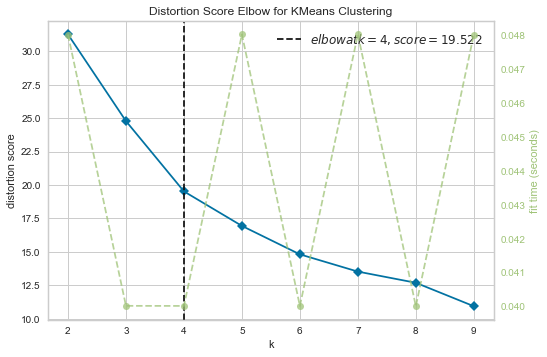

In [97]:
adi_grouped_clustering = adi_grouped.drop('Neighborhood', 1)
model = KElbowVisualizer(KMeans(), k=(2,10))
model.fit(adi_grouped_clustering)
model.show()

from above graph it can be infered that optimal value of k is 4.
Applying k-means cluster algorithm to create cluster of venues.

In [98]:
kclusters = 4

#adi_grouped_clustering = adi_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(adi_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 0, 0, 1, 0, 0, 0, 0, 0, 0])

Inserting cluster label to venues data.

In [99]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
adi_merged = venues

adi_merged = adi_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
adi_merged.dropna(inplace=True)
adi_merged

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bodakdev,Ph Se Food,23.038755,72.510887,Casual Dining,18757684.0,"North Indian, Chinese, Fast Food",900.0,4.5,Excellent,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Beverage Shop,Bakery,Sweet Shop,Paan Shop,Kiosk
1,"Ahmedabad One Mall, Vastrapur",Millhouse,23.039770,72.531508,Casual Dining,18658177.0,"Continental, Italian",1200.0,4.5,Excellent,0,Quick Bites,Food Court,Dessert Parlour,Casual Dining,Café,Sweet Shop,Paan Shop,Kiosk,Food Truck,Fine Dining
2,Bodakdev,The Red Bistro,23.039852,72.509181,Casual Dining,18663856.0,"Mexican, Italian, North Indian",1400.0,4.6,Excellent,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Beverage Shop,Bakery,Sweet Shop,Paan Shop,Kiosk
3,Prahlad Nagar,Kadak Bhagat,23.012411,72.514392,Casual Dining,18819827.0,"North Indian, Chinese, Fast Food",1000.0,4.4,Very Good,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Sweet Shop,Kiosk,Food Court,Beverage Shop,Paan Shop
4,Vastrapur,Urban Khichdi,23.028315,72.542458,Casual Dining,18718880.0,"North Indian, Continental",600.0,4.7,Excellent,0,Quick Bites,Casual Dining,Dessert Parlour,Café,Beverage Shop,Food Truck,Food Court,Dhaba,Bakery,Sweet Shop
5,Navrangpura,Soulmate - Make Moments Memorable,23.030857,72.548006,Casual Dining,18707059.0,"Italian, Continental",1500.0,4.7,Excellent,0,Quick Bites,Café,Kiosk,Casual Dining,Dessert Parlour,Sweet Shop,Beverage Shop,Bakery,Food Court,Bhojanalya
6,Bodakdev,Huber & Holly,23.038169,72.512435,Dessert Parlour,18396250.0,"Desserts, Italian",500.0,4.8,Excellent,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Beverage Shop,Bakery,Sweet Shop,Paan Shop,Kiosk
7,Bodakdev,Eleven 11 Restro Cafe,23.038747,72.510827,Café,18672107.0,"Cafe, Italian, North Indian",1000.0,4.3,Very Good,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Beverage Shop,Bakery,Sweet Shop,Paan Shop,Kiosk
8,Navrangpura,The Esplendido Cafe,23.028663,72.560280,Café,18766005.0,"Cafe, American, Italian, Chinese",800.0,4.5,Excellent,0,Quick Bites,Café,Kiosk,Casual Dining,Dessert Parlour,Sweet Shop,Beverage Shop,Bakery,Food Court,Bhojanalya
9,Bodakdev,La Pino'z Pizza,23.038035,72.512474,Quick Bites,18438909.0,"Pizza, Italian",500.0,4.5,Excellent,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Beverage Shop,Bakery,Sweet Shop,Paan Shop,Kiosk


In [100]:
adi_merged['Cluster Labels'] = adi_merged['Cluster Labels'].astype(int)
adi_merged.head()

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bodakdev,Ph Se Food,23.038755,72.510887,Casual Dining,18757684.0,"North Indian, Chinese, Fast Food",900.0,4.5,Excellent,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Beverage Shop,Bakery,Sweet Shop,Paan Shop,Kiosk
1,"Ahmedabad One Mall, Vastrapur",Millhouse,23.039770,72.531508,Casual Dining,18658177.0,"Continental, Italian",1200.0,4.5,Excellent,0,Quick Bites,Food Court,Dessert Parlour,Casual Dining,Café,Sweet Shop,Paan Shop,Kiosk,Food Truck,Fine Dining
2,Bodakdev,The Red Bistro,23.039852,72.509181,Casual Dining,18663856.0,"Mexican, Italian, North Indian",1400.0,4.6,Excellent,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Beverage Shop,Bakery,Sweet Shop,Paan Shop,Kiosk
3,Prahlad Nagar,Kadak Bhagat,23.012411,72.514392,Casual Dining,18819827.0,"North Indian, Chinese, Fast Food",1000.0,4.4,Very Good,0,Casual Dining,Quick Bites,Café,Dessert Parlour,Food Truck,Sweet Shop,Kiosk,Food Court,Beverage Shop,Paan Shop
4,Vastrapur,Urban Khichdi,23.028315,72.542458,Casual Dining,18718880.0,"North Indian, Continental",600.0,4.7,Excellent,0,Quick Bites,Casual Dining,Dessert Parlour,Café,Beverage Shop,Food Truck,Food Court,Dhaba,Bakery,Sweet Shop


Plotting venues with cluster labels on map.

In [101]:
map_clusters = folium.Map(location=[23.0225,72.5714], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(adi_merged['Venue Latitude'], adi_merged['Venue Longitude'], adi_merged['Neighborhood'], adi_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

Getting all the 4 cluster that were created for analyzing.

In [116]:
clust1 = adi_merged.loc[adi_merged['Cluster Labels'] == 0, adi_merged.columns[[0] + list(range(1,11))]]
print(clust1.shape)
clust1

(1049, 11)


,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text,Cluster Labels
0,Bodakdev,Ph Se Food,23.038755,72.510887,Casual Dining,18757684.0,"North Indian, Chinese, Fast Food",900.0,4.5,Excellent,0
1,"Ahmedabad One Mall, Vastrapur",Millhouse,23.039770,72.531508,Casual Dining,18658177.0,"Continental, Italian",1200.0,4.5,Excellent,0
2,Bodakdev,The Red Bistro,23.039852,72.509181,Casual Dining,18663856.0,"Mexican, Italian, North Indian",1400.0,4.6,Excellent,0
3,Prahlad Nagar,Kadak Bhagat,23.012411,72.514392,Casual Dining,18819827.0,"North Indian, Chinese, Fast Food",1000.0,4.4,Very Good,0
4,Vastrapur,Urban Khichdi,23.028315,72.542458,Casual Dining,18718880.0,"North Indian, Continental",600.0,4.7,Excellent,0
5,Navrangpura,Soulmate - Make Moments Memorable,23.030857,72.548006,Casual Dining,18707059.0,"Italian, Continental",1500.0,4.7,Excellent,0
6,Bodakdev,Huber & Holly,23.038169,72.512435,Dessert Parlour,18396250.0,"Desserts, Italian",500.0,4.8,Excellent,0
7,Bodakdev,Eleven 11 Restro Cafe,23.038747,72.510827,Café,18672107.0,"Cafe, Italian, North Indian",1000.0,4.3,Very Good,0
8,Navrangpura,The Esplendido Cafe,23.028663,72.560280,Café,18766005.0,"Cafe, American, Italian, Chinese",800.0,4.5,Excellent,0
9,Bodakdev,La Pino'z Pizza,23.038035,72.512474,Quick Bites,18438909.0,"Pizza, Italian",500.0,4.5,Excellent,0


Plotting average_cost_for_two, rating text for each cluster using seaborn and matplotlib library.

Average Rating of Restaurants in cluster 1 : 3.1988560533841737
Aggregate of Average cost for two in cluster 1 : 445.3860819828408


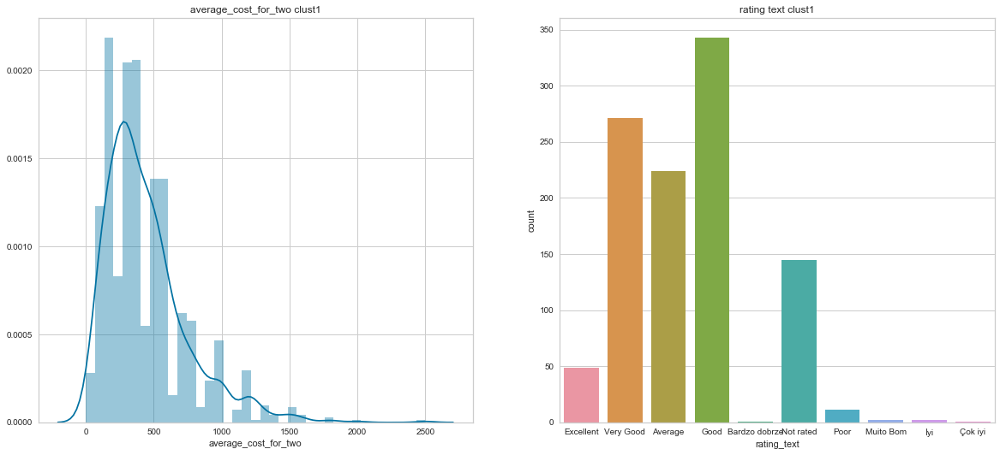

In [103]:
plt.figure(figsize=(20,40))

plt.subplot(4,2,1)
sns.distplot(clust1["average_cost_for_two"])
plt.title("average_cost_for_two clust1")

plt.subplot(4,2,2)
sns.countplot(clust1["rating_text"])
plt.title("rating text clust1")

print("Average Rating of Restaurants in cluster 1 :", clust1['aggregate_rating'].mean())
print("Aggregate of Average cost for two in cluster 1 :", clust1['average_cost_for_two'].mean())

Text(0.5, 1.0, '5 most comman Cuisines offered in cluster 1')

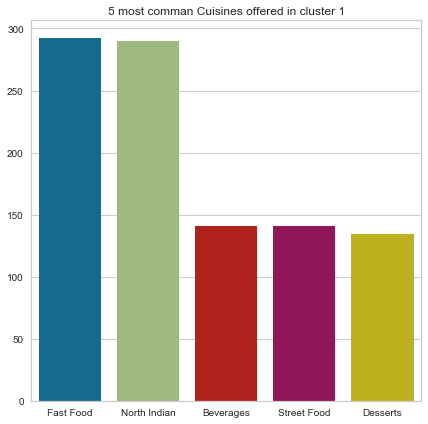

In [104]:
Cuisines_Count1 = {}
for i in clust1['cuisines']:
    for x in str(i).split(', '):
        if x in Cuisines_Count1:
            Cuisines_Count1[x] = Cuisines_Count1[x] + 1
        else:
            Cuisines_Count1[x] = 1
Cuisines_Count1 = {k: v for k, v in sorted(Cuisines_Count1.items(), key=lambda item: item[1])}
            
plt.figure(figsize=(7,7))
sns.barplot(x=[str(x) for x in Cuisines_Count1.keys()][-1:-6:-1],y=[int(x) for x in Cuisines_Count1.values()][-1:-6:-1])
plt.title("5 most comman Cuisines offered in cluster 1")

In [117]:
clust2 = adi_merged.loc[adi_merged['Cluster Labels'] == 1, adi_merged.columns[[0] + list(range(1,11))]]
print(clust2.shape)
clust2

(66, 11)


,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text,Cluster Labels
16,Gulbai Tekra,Yash's GBT,23.026672,72.552446,Casual Dining,18529585.0,"Italian, Cafe",800.0,4.2,Very Good,1
21,Gulbai Tekra,Legends Of Punjab - By Pepperazi,23.027428,72.545478,Casual Dining,18902811.0,"North Indian, Italian, BBQ, Mexican, Thai",700.0,4.1,Very Good,1
39,Lal Darwaja,Agashiye - The House Of MG,23.027251,72.581735,Fine Dining,110454.0,Gujarati,1900.0,4.6,Excellent,1
69,"Safal Pegasus, Prahlad Nagar",Jassi De Parathe,23.012160,72.510830,Casual Dining,110990.0,North Indian,650.0,4.5,Excellent,1
99,"Fortune Landmark, Ashram Road",Wind & Water- Fortune Landmark,23.047599,72.570532,Casual Dining,18438899.0,"Continental, Italian, North Indian, Asian",2300.0,4.1,Very Good,1
103,"Renaissance Hotel, Sola",R Kitchen - Renaissance Hotel,23.066592,72.524387,Casual Dining,18615472.0,"North Indian, Continental",2000.0,4.1,Very Good,1
106,"Fortune Landmark, Ashram Road",Zodiac- Fortune Landmark,23.047506,72.570500,Casual Dining,18438905.0,"North Indian, Italian, Continental",2000.0,4.3,Very Good,1
110,"Ramada, Prahlad Nagar",Smokyzz - Grill & Barbeque,23.010479,72.504954,Casual Dining,18552231.0,"North Indian, BBQ",2000.0,3.4,Average,1
118,"Fortune Landmark, Ashram Road",Earthen Oven - Fortune Landmark,23.047699,72.570682,Fine Dining,110475.0,"North Indian, Mughlai",1600.0,4.3,Very Good,1
119,"Crowne Plaza, Satellite",Aroma - Crowne Plaza,23.014584,72.504325,Café,113368.0,"Cafe, Beverages",1600.0,3.9,Good,1


Average Rating of Restaurants in cluster 2 : 3.8212121212121217
Aggregate of Average cost for two in cluster 2 : 957.5757575757576


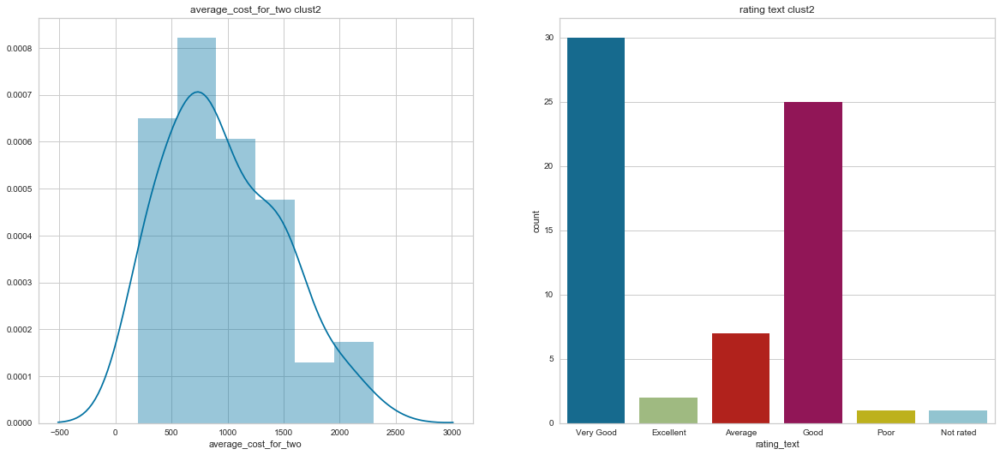

In [106]:
plt.figure(figsize=(20,40))

plt.subplot(4,2,1)
sns.distplot(clust2["average_cost_for_two"])
plt.title("average_cost_for_two clust2")

plt.subplot(4,2,2)
sns.countplot(clust2["rating_text"])
plt.title("rating text clust2")

print("Average Rating of Restaurants in cluster 2 :", clust2['aggregate_rating'].mean())
print("Aggregate of Average cost for two in cluster 2 :", clust2['average_cost_for_two'].mean())

Fetching Couisines count and ploting top 5 cuisines offered by venues in each cluster neighborhood.

Text(0.5, 1.0, '5 most comman Cuisines offered in cluster 2')

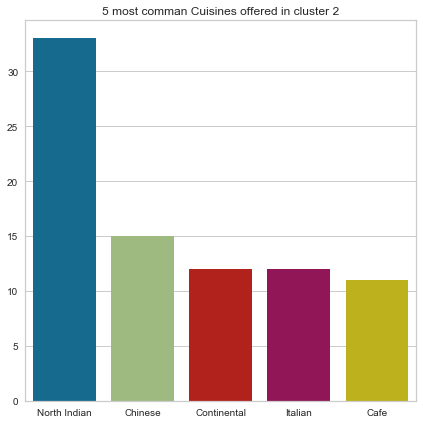

In [107]:
Cuisines_Count2 = {}
for i in clust2['cuisines']:
    for x in str(i).split(', '):
        if x in Cuisines_Count2:
            Cuisines_Count2[x] = Cuisines_Count2[x] + 1
        else:
            Cuisines_Count2[x] = 1
Cuisines_Count2 = {k: v for k, v in sorted(Cuisines_Count2.items(), key=lambda item: item[1])}
            
plt.figure(figsize=(7,7))
sns.barplot(x=[str(x) for x in Cuisines_Count2.keys()][-1:-6:-1],y=[int(x) for x in Cuisines_Count2.values()][-1:-6:-1])
plt.title("5 most comman Cuisines offered in cluster 2")

In [118]:
clust3 = adi_merged.loc[adi_merged['Cluster Labels'] == 2, adi_merged.columns[[0] + list(range(1,11))]]
print(clust3.shape)
clust3

(25, 11)


,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text,Cluster Labels
38,"Hyatt Regency, Ashram Road",Tinello - Hyatt Regency,23.043638,72.570044,Fine Dining,113732.0,Italian,2500.0,4.5,Excellent,2
50,"Courtyard By Marriott, Satellite",Java+ - Courtyard By Marriott,23.027690,72.512067,Café,113018.0,Cafe,1000.0,4.1,Very Good,2
97,"The Gateway Hotel Ummed, Hansol",Jacaranda - The Ummed,23.083127,72.617374,Fine Dining,110510.0,"North Indian, Continental, Gujarati",2500.0,4.0,Very Good,2
98,"Hyatt Regency, Ashram Road",China House - Hyatt Regency,23.043662,72.570083,Fine Dining,18161729.0,"Chinese, Asian",2400.0,4.7,Excellent,2
100,"Courtyard By Marriott, Satellite",Bayleaf - Courtyard By Marriott,23.027774,72.512055,Fine Dining,18231895.0,North Indian,2200.0,4.5,Excellent,2
101,"Hyatt, Vastrapur",Collage - Hyatt,23.038835,72.530941,Fine Dining,112098.0,"Mughlai, North Indian, Continental",2000.0,4.2,Very Good,2
102,"The Fern, Sola",The Garden Cafe - The Fern,23.063700,72.521869,Casual Dining,110516.0,"North Indian, South Indian",2000.0,4.3,Very Good,2
104,"Hyatt Regency, Ashram Road",Chai Shop - Hyatt Regency,23.043925,72.570299,Café,113733.0,"Cafe, North Indian",2000.0,4.2,Very Good,2
105,"Radisson Blu, Ambavadi",The Great Kabab Factory - Radisson Blu,23.023081,72.557166,Fine Dining,111915.0,"Mughlai, Kebab, North Indian",2000.0,4.0,Very Good,2
108,"The Gateway Hotel Ummed, Hansol",Narmada - The Ummed,23.074225,72.638317,Fine Dining,110511.0,"North Indian, Mughlai",2000.0,4.2,Very Good,2


Average Rating of Restaurants in cluster 3 : 3.7800000000000007
Aggregate of Average cost for two in cluster 3 : 1578.0


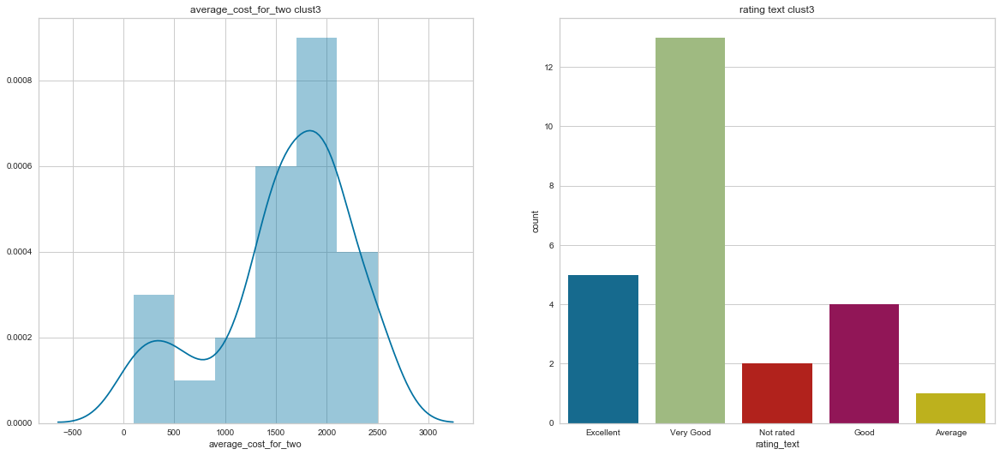

In [109]:
plt.figure(figsize=(20,40))

plt.subplot(4,2,1)
sns.distplot(clust3["average_cost_for_two"])
plt.title("average_cost_for_two clust3")

plt.subplot(4,2,2)
sns.countplot(clust3["rating_text"])
plt.title("rating text clust3")

print("Average Rating of Restaurants in cluster 3 :", clust3['aggregate_rating'].mean())
print("Aggregate of Average cost for two in cluster 3 :", clust3['average_cost_for_two'].mean())

Text(0.5, 1.0, '5 most comman Cuisines offered in cluster 3')

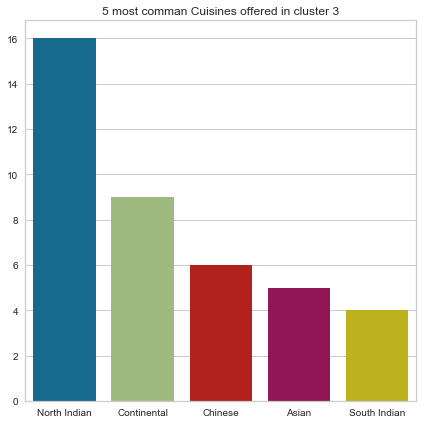

In [82]:
Cuisines_Count3 = {}
for i in clust3['cuisines']:
    for x in str(i).split(', '):
        if x in Cuisines_Count3:
            Cuisines_Count3[x] = Cuisines_Count3[x] + 1
        else:
            Cuisines_Count3[x] = 1
Cuisines_Count3 = {k: v for k, v in sorted(Cuisines_Count3.items(), key=lambda item: item[1])}
            
plt.figure(figsize=(7,7))
sns.barplot(x=[str(x) for x in Cuisines_Count3.keys()][-1:-6:-1],y=[int(x) for x in Cuisines_Count3.values()][-1:-6:-1])
plt.title("5 most comman Cuisines offered in cluster 3")

In [119]:
clust4 = adi_merged.loc[adi_merged['Cluster Labels'] == 3, adi_merged.columns[[0] + list(range(1,11))]]
print(clust4.shape)
clust4

(68, 11)


,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category,res_id,cuisines,average_cost_for_two,aggregate_rating,rating_text,Cluster Labels
154,"Gulmohar Park, Satellite",Mainland China,23.026522,72.509754,Casual Dining,110265.0,"Chinese, Asian, Sushi, Japanese, Thai",1200.0,4.1,Very Good,3
270,"SBR Social, Bodakdev",Pure Beans & Creams,23.042165,72.494477,Food Court,18548088.0,"Beverages, Ice Cream, Desserts",350.0,4.6,Excellent,3
297,"Urban Chowk, Thaltej",9834 The Fruit Truck@ Urban Chowk,23.058191,72.517274,Beverage Shop,18585655.0,"Beverages, Desserts",400.0,4.4,Very Good,3
865,"Food Junction, Bodakdev",Girish Cold Drinks,23.033585,72.506939,Beverage Shop,18661379.0,Beverages,300.0,3.3,Average,3
893,"SBR Social, Bodakdev",Ice Studio,23.042362,72.494257,Beverage Shop,18932887.0,Beverages,200.0,0.0,Not rated,3
946,"Arved Transcube Plaza , Ranip",Subway,23.068330,72.576080,Food Court,18517389.0,"Healthy Food, Sandwich, Salad",500.0,3.5,Good,3
948,"Urban Chowk, Thaltej",Punjabi Virsa @Urban Chowk,23.057869,72.519225,Food Court,18580601.0,North Indian,300.0,3.9,Good,3
949,"Urban Chowk, Thaltej",La Vita - Urban Chowk,23.057971,72.519104,Food Court,18580655.0,Fast Food,400.0,3.8,Good,3
950,"SBR Social, Bodakdev",Stick With It,23.042016,72.494278,Food Court,18894431.0,"Desserts, Fast Food",250.0,4.1,Very Good,3
951,"Urban Chowk, Thaltej",The Burger Factory @Urban Chowk,23.058020,72.519390,Food Court,18580602.0,"Burger, Fast Food",300.0,3.7,Good,3


Average Rating of Restaurants in cluster 4 : 2.427941176470587
Aggregate of Average cost for two in cluster 4 : 414.70588235294116


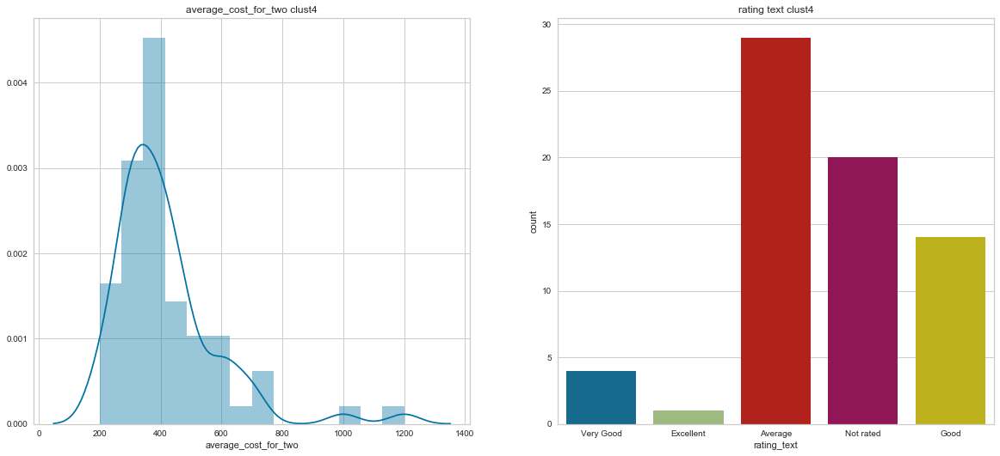

In [111]:
plt.figure(figsize=(20,40))

plt.subplot(4,2,1)
sns.distplot(clust4["average_cost_for_two"])
plt.title("average_cost_for_two clust4")

plt.subplot(4,2,2)
sns.countplot(clust4["rating_text"])
plt.title("rating text clust4")

print("Average Rating of Restaurants in cluster 4 :", clust4['aggregate_rating'].mean())
print("Aggregate of Average cost for two in cluster 4 :", clust4['average_cost_for_two'].mean())

Text(0.5, 1.0, '5 most comman Cuisines offered in cluster 4')

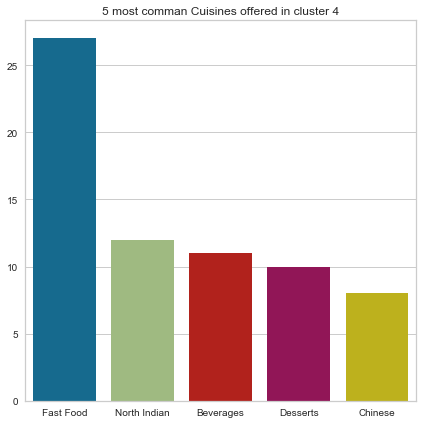

In [112]:
Cuisines_Count4 = {}
for i in clust4['cuisines']:
    for x in str(i).split(', '):
        if x in Cuisines_Count4:
            Cuisines_Count4[x] = Cuisines_Count4[x] + 1
        else:
            Cuisines_Count4[x] = 1
Cuisines_Count4 = {k: v for k, v in sorted(Cuisines_Count4.items(), key=lambda item: item[1])}
            
plt.figure(figsize=(7,7))
sns.barplot(x=[str(x) for x in Cuisines_Count4.keys()][-1:-6:-1],y=[int(x) for x in Cuisines_Count4.values()][-1:-6:-1])
plt.title("5 most comman Cuisines offered in cluster 4")

## Discusion

From table 1 above one can observe that each cluster has different number of venues. Cluster 1 has maximum venues being spread all over Ahmedabad. Cluster 2 is second most populous followed by cluster 4. Cluster 3 has least number of venues.
From graphs top 5 most common cuisines offered one can infer that North Indian and Fast Food cuisines are most common foods available in each cluster. In fig11 of cluster 1 one can observe that these cuisines are offered by 250+ venues. 
Cluster 1 has average rating of 3.19 in text rating it is ‘Average’ rating and cost for two people is INR 445 which is quite low compared to other clusters.
Cluster 2 has average rating of 3.8 in text rating it is ‘Good’ rating and cost for two people is INR 957 which is medium range pricing compared to other clusters.
Cluster 3 has average rating of 3.78 in text rating it is ‘Good’ rating and cost for two people is INR 1578 which is high range pricing compared to other clusters.
Cluster 4 has average rating of 2.4 in text rating it is ‘Poor’ rating and cost for two people is INR 414 which is low range pricing compared to other clusters.
Cluster 1 and 4 have average and poor rating respectively can be chosen for business purpose as food quality offered in these clusters have chance of being improved, business offering good quality food in both clusters will face medium to low competition.

## Conclusion

As a result, all the clusters are offering wide variety of cuisines but for big city like Ahmedabad very few venues (cluster 2 & 3) are offering good quality food.
The cuisines offered in clusters 2 & 3 cost medium to high, which may not be affordable for every person. So, there are fair chances for improvement of food quality in a low-medium price range venue.
Thus, travelers looking for variety of foods offered across Ahmedabad can use this information also business owners can use this information to improvise their business strategies or person looking for opening a new venue can use this information and can know what competition he/she will face with its nearby venues.
